In [1]:
import plotly.io as pio
pio.renderers.default = 'notebook_connected'

import numpy as np
import pandas as pd 

import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

import plotly.express as px

from datetime import date, timedelta

import plotly.offline as py

import folium 
from folium import plugins

import warnings
warnings.filterwarnings("ignore")

import os

In [2]:
!pip install plotly

  Stored in directory: C:\Users\jieun\AppData\Local\pip\Cache\wheels\d7\a9\33\acc7b709e2a35caa7d4cae442f6fe6fbf2c43f80823d46460c
Successfully built retrying


In [2]:
patient = pd.read_csv("C:/dataset/dacon_3_COVID-19/2_patientInfo.csv")
time = pd.read_csv("C:/dataset/dacon_3_COVID-19/3_Time.csv")
region = pd.read_csv("C:/dataset/dacon_3_COVID-19/4_region.csv")

In [15]:
patient.head()

,patient_id,global_num,sex,birth_year,age,country,province,city,disease,infection_case,infection_order,infected_by,contact_number,symptom_onset_date,confirmed_date,released_date,deceased_date,state
0,1000000001,2.0,male,1964.0,50s,Korea,Seoul,Gangseo-gu,NaN,overseas inflow,1.0,NaN,75.0,2020-01-22,2020-01-23,2020-02-05,NaN,released
1,1000000002,5.0,male,1987.0,30s,Korea,Seoul,Jungnang-gu,NaN,overseas inflow,1.0,NaN,31.0,NaN,2020-01-30,2020-03-02,NaN,released
2,1000000003,6.0,male,1964.0,50s,Korea,Seoul,Jongno-gu,NaN,contact with patient,2.0,2.002000e+09,17.0,NaN,2020-01-30,2020-02-19,NaN,released
3,1000000004,7.0,male,1991.0,20s,Korea,Seoul,Mapo-gu,NaN,overseas inflow,1.0,NaN,9.0,2020-01-26,2020-01-30,2020-02-15,NaN,released
4,1000000005,9.0,female,1992.0,20s,Korea,Seoul,Seongbuk-gu,NaN,contact with patient,2.0,1.000000e+09,2.0,NaN,2020-01-31,2020-02-24,NaN,released


In [6]:
region.head()

,code,province,city,latitude,longitude,elementary_school_count,kindergarten_count,university_count,academy_ratio,elderly_population_ratio,elderly_alone_ratio,nursing_home_count
0,10000,Seoul,Seoul,37.566953,126.977977,607,830,48,1.44,15.38,5.8,22739
1,10010,Seoul,Gangnam-gu,37.518421,127.047222,33,38,0,4.18,13.17,4.3,3088
2,10020,Seoul,Gangdong-gu,37.530492,127.123837,27,32,0,1.54,14.55,5.4,1023
3,10030,Seoul,Gangbuk-gu,37.639938,127.025508,14,21,0,0.67,19.49,8.5,628
4,10040,Seoul,Gangseo-gu,37.551166,126.849506,36,56,1,1.17,14.39,5.7,1080


In [8]:
time.head()

,date,time,test,negative,confirmed,released,deceased
0,2020-01-20,16,1,0,1,0,0
1,2020-01-21,16,1,0,1,0,0
2,2020-01-22,16,4,3,1,0,0
3,2020-01-23,16,22,21,1,0,0
4,2020-01-24,16,27,25,2,0,0


# Missing value 개수
 : 살구색이 missing value 

patient_id             0.0
global_num            32.7
sex                    2.0
birth_year            13.1
age                    2.2
country                0.0
province               0.0
city                   2.4
disease               99.5
infection_case        23.1
infection_order       99.1
infected_by           75.8
contact_number        81.5
symptom_onset_date    85.8
confirmed_date         0.1
released_date         63.4
deceased_date         98.2
state                  0.0
dtype: float64

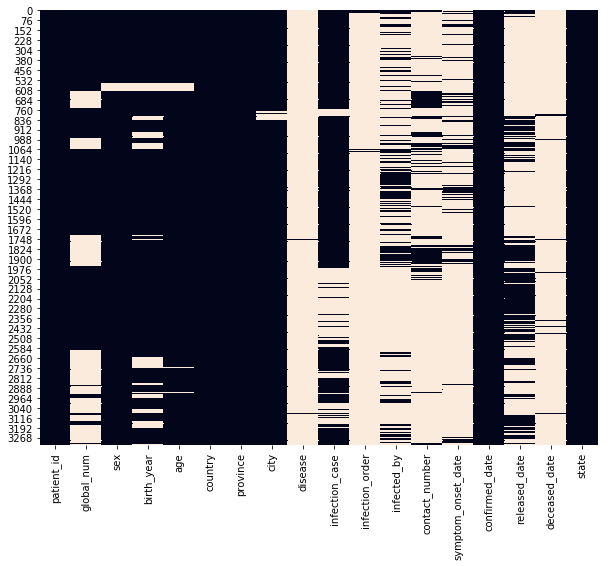

In [16]:
display(round(patient.isnull().sum()/patient.shape[0] * 100,1))

plt.figure(figsize = (10,8))
sns.heatmap(patient.isnull(), cbar=False)
plt.show()

# 개별 feature 시각화
## PatientInfo의 state 변수

In [3]:
isolate_pct = 100 * patient.query('state == "isolated"').shape[0] / patient.shape[0]
release_pct = 100 * patient.query('state == "released"').shape[0] / patient.shape[0]
decease_pct = 100 * patient.query('state == "deceased"').shape[0] / patient.shape[0]

print('전체 환자 중 "격리" 환자는', round(isolate_pct,2),'% 입니다')
print('전체 환자 중 "격리 해제" 환자는', round(release_pct,2),'% 입니다')
print('전체 환자 중 "사망" 환자는', round(decease_pct,2),'% 입니다')

전체 환자 중 "격리" 환자는 48.77 % 입니다
전체 환자 중 "격리 해제" 환자는 49.22 % 입니다
전체 환자 중 "사망" 환자는 2.01 % 입니다


In [4]:
def pie_chart(data, col, title = ''):
    cnt_df = data[col].value_counts().reset_index()
    fig = px.pie(cnt_df, 
                 values = col, 
                 names = 'index', 
                 title = title, 
                 template = 'seaborn',
                 color_discrete_sequence=px.colors.sequential.RdBu)
    fig.update_traces(rotation=90, pull=0.05, textinfo="value+percent+label")
    fig.show()

In [5]:
pie_chart(patient, 'state', title = 'Isolated / Released / Deceased patient pie chart')

## 격리 / 격리 해제 / 사망 환자 살펴보기

In [21]:
release = patient.query('state == "released"')
isolate = patient.query('state == "isolated"')
decease = patient.query('state == "deceased"')

In [22]:
pie_chart(data = release, col = 'sex', title = '"Released" patient sex distribution')
pie_chart(data = isolate, col = 'sex', title = '"Isolated" patient sex distribution')
pie_chart(data = decease, col = 'sex', title = '"Deceased" patient sex distribution')

## 나이 살펴보기

In [25]:
patient['age_2020'] = 2020 - patient['birth_year'] + 1

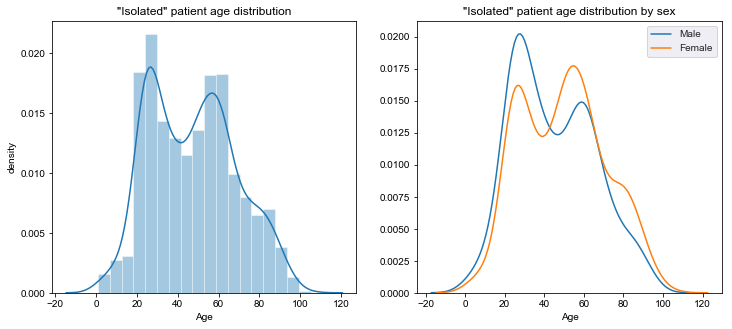

In [24]:
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2)
fig.set_size_inches(12,5)

sns.set_style("darkgrid")
sns.distplot(isolate['age_2020'].dropna(), ax = ax1)
ax1.set(title = '"Isolated" patient age distribution',xlabel = 'Age', ylabel = 'density')

sns.set_style("darkgrid")
sns.kdeplot(isolate.query('sex == "male"')['age_2020'].dropna(), label = 'Male', ax = ax2)
sns.kdeplot(isolate.query('sex == "female"')['age_2020'].dropna(), label = 'Female', ax = ax2)
ax2.set(title = '"Isolated" patient age distribution by sex',xlabel = 'Age')

plt.show()

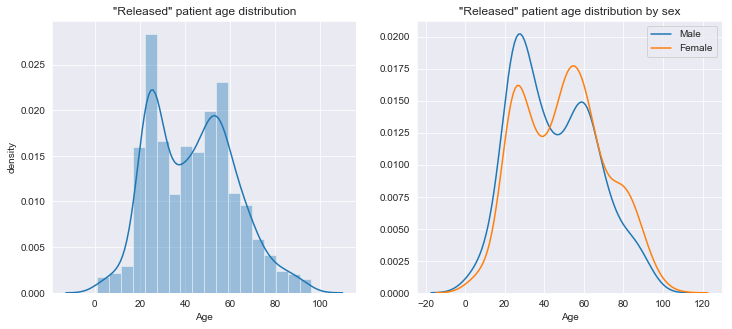

In [27]:
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2)
fig.set_size_inches(12,5)

sns.set_style("darkgrid")
sns.distplot(release['age_2020'].dropna(), ax = ax1)
ax1.set(title = '"Released" patient age distribution', xlabel = 'Age', ylabel = 'density')

sns.set_style("darkgrid")
sns.kdeplot(isolate.query('sex == "male"')['age_2020'].dropna(), label = 'Male', ax = ax2)
sns.kdeplot(isolate.query('sex == "female"')['age_2020'].dropna(), label = 'Female', ax = ax2)
ax2.set(title = '"Released" patient age distribution by sex', xlabel = 'Age')
plt.show()

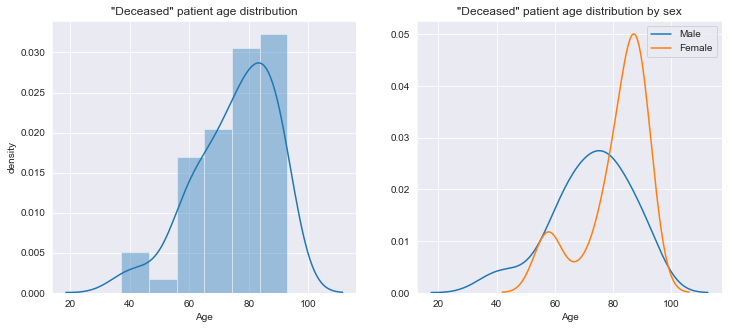

In [28]:
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2)
fig.set_size_inches(12,5)

sns.set_style("darkgrid")
sns.distplot(decease['age_2020'].dropna(), ax = ax1)
ax1.set(title = '"Deceased" patient age distribution', xlabel = 'Age', ylabel = 'density')

sns.set_style("darkgrid")
sns.kdeplot(decease.query('sex == "male"')['age_2020'].dropna(), label = 'Male', ax = ax2)
sns.kdeplot(decease.query('sex == "female"')['age_2020'].dropna(), label = 'Female', ax = ax2)
ax2.set(title = '"Deceased" patient age distribution by sex', xlabel = 'Age')
plt.show()

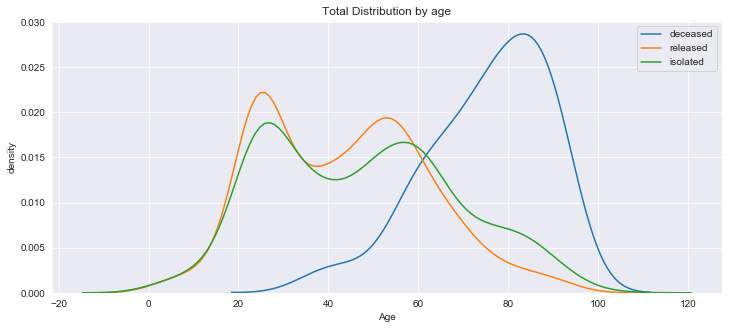

In [29]:
plt.figure(figsize = (12,5))
sns.set_style("darkgrid")
sns.kdeplot(decease['age_2020'].dropna(), label = 'deceased')
sns.kdeplot(release['age_2020'].dropna(), label = 'released')
sns.kdeplot(isolate['age_2020'].dropna(), label = 'isolated')
plt.title('Total Distribution by age')
plt.xlabel('Age'); plt.ylabel('density')
plt.show()

## infection case를 살펴보기

In [30]:
pie_chart(data = patient, col = 'infection_case')

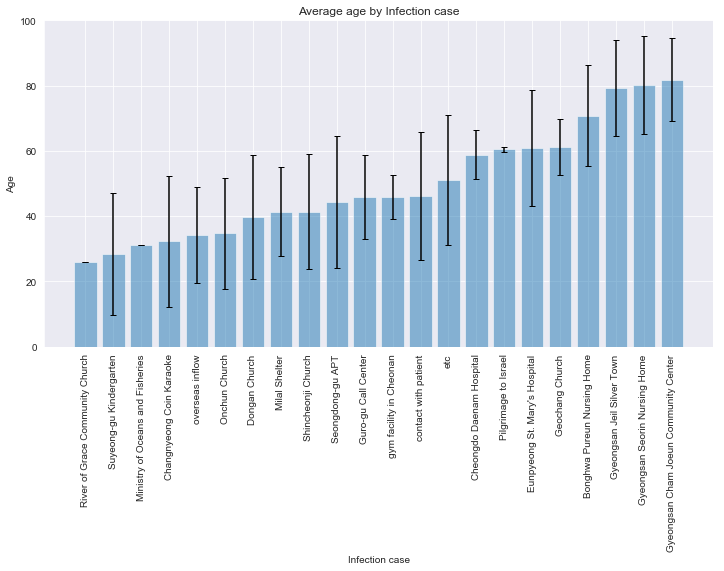

In [31]:
# preprocessing for ploting
age_by_infection_case = patient[['infection_case','age_2020']].dropna()\
.groupby('infection_case')['age_2020']\
.agg(['mean', 'std']).fillna(0)\
.sort_values('mean')

plt.figure(figsize = (12,6))
plt.bar(x = age_by_infection_case.index,
        yerr = age_by_infection_case['std'],
        height = age_by_infection_case['mean'],
        alpha = 0.5, ecolor = 'black', capsize = 3)
plt.xticks(rotation=90)
plt.title('Average age by Infection case')
plt.ylabel('Age'); plt.xlabel('Infection case')
plt.show()

del age_by_infection_case

## contact number 를 살펴보기

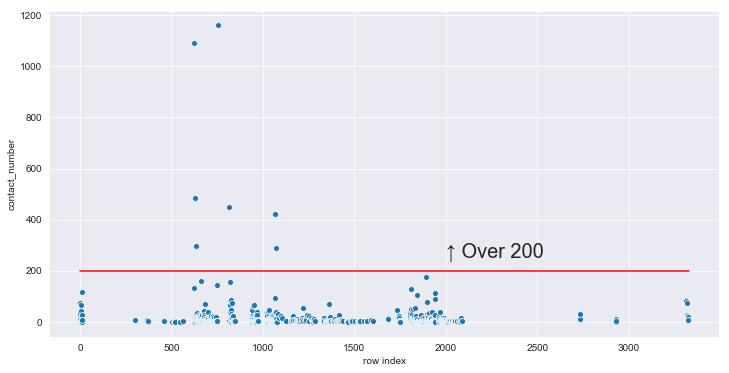

In [34]:
plt.figure(figsize = (12,6))
sns.scatterplot(patient.index, patient['contact_number'])
plt.plot([0,len(patient)], [200,200], color = 'red')
plt.text(2000, 250, '↑ Over 200',fontsize = 20)
plt.xlabel('row index')
plt.show()

## 지리 데이터 시각화

In [36]:
regional_patient = pd.merge(patient[['patient_id','confirmed_date','sex','age','province','city']],
                            region[['province','city','latitude','longitude']], 
                            how = 'left', on = ['province','city'])

In [37]:
pie_chart(data = patient, col = 'province', title = 'Total Patient by Province')
pie_chart(data = isolate, col = 'province', title = 'Isolated Patient by Province')
pie_chart(data = release, col = 'province', title = 'released Patient by Province')
pie_chart(data = decease, col = 'province', title = 'deceased Patient by Province')

## 지역 별 확진 환자

In [40]:
regional_count = regional_patient[['latitude','longitude']].dropna() # drop missing values

m = folium.Map([36, 128], zoom_start=7)

plugins.MousePosition().add_to(m) 

plugins.MarkerCluster(regional_count).add_to(m)

m

## 성별에 따른 확진 환자

In [42]:
male_patient = regional_patient\
.query('sex in ("male")')[['latitude','longitude']].dropna()

female_patient = regional_patient\
.query('sex in ("female")')[['latitude','longitude']].dropna()


m = folium.Map([36, 128], zoom_start=7) 

initial = folium.plugins.MarkerCluster(control=False)

m.add_child(initial)


female_g = plugins.FeatureGroupSubGroup(initial, 'Female')
m.add_child(female_g)

male_g = plugins.FeatureGroupSubGroup(initial, 'Male') 
m.add_child(male_g)


plugins.MarkerCluster(female_patient).add_to(female_g)

plugins.MarkerCluster(male_patient).add_to(male_g)



folium.LayerControl(collapsed=False).add_to(m)

m

## 나이에 따른 확진 환자

In [44]:
age0_patient = regional_patient.query('age == "0s"')[['latitude','longitude']].dropna()
age10_patient = regional_patient.query('age == "10s"')[['latitude','longitude']].dropna()
age20_patient = regional_patient.query('age == "20s"')[['latitude','longitude']].dropna()
age30_patient = regional_patient.query('age == "30s"')[['latitude','longitude']].dropna()
age40_patient = regional_patient.query('age == "40s"')[['latitude','longitude']].dropna()
age50_patient = regional_patient.query('age == "50s"')[['latitude','longitude']].dropna()
age60_patient = regional_patient.query('age == "60s"')[['latitude','longitude']].dropna()
age70_patient = regional_patient.query('age == "70s"')[['latitude','longitude']].dropna()
age80_patient = regional_patient.query('age == "80s"')[['latitude','longitude']].dropna()
age90_patient = regional_patient.query('age == "90s"')[['latitude','longitude']].dropna()



m = folium.Map([36, 128], zoom_start=7) 

initial = folium.plugins.MarkerCluster(control=False)

m.add_child(initial)


age0_g = plugins.FeatureGroupSubGroup(initial, '0s'); m.add_child(age0_g)
age10_g = plugins.FeatureGroupSubGroup(initial, '10s'); m.add_child(age10_g)
age20_g = plugins.FeatureGroupSubGroup(initial, '20s'); m.add_child(age20_g)
age30_g = plugins.FeatureGroupSubGroup(initial, '30s'); m.add_child(age30_g)
age40_g = plugins.FeatureGroupSubGroup(initial, '40s'); m.add_child(age40_g)
age50_g = plugins.FeatureGroupSubGroup(initial, '50s'); m.add_child(age50_g)
age60_g = plugins.FeatureGroupSubGroup(initial, '60s'); m.add_child(age60_g)
age70_g = plugins.FeatureGroupSubGroup(initial, '70s'); m.add_child(age70_g)
age80_g = plugins.FeatureGroupSubGroup(initial, '80s'); m.add_child(age80_g)
age90_g = plugins.FeatureGroupSubGroup(initial, '90s'); m.add_child(age90_g)


plugins.MarkerCluster(age0_patient).add_to(age0_g)
plugins.MarkerCluster(age10_patient).add_to(age10_g)
plugins.MarkerCluster(age20_patient).add_to(age20_g)
plugins.MarkerCluster(age30_patient).add_to(age30_g)
plugins.MarkerCluster(age40_patient).add_to(age40_g)
plugins.MarkerCluster(age50_patient).add_to(age50_g)
plugins.MarkerCluster(age60_patient).add_to(age60_g)
plugins.MarkerCluster(age70_patient).add_to(age70_g)
plugins.MarkerCluster(age80_patient).add_to(age80_g)
plugins.MarkerCluster(age90_patient).add_to(age90_g)


folium.LayerControl(collapsed=False).add_to(m)

m

# 시간 데이터 시각화
## 시간에 따른 검사, 음성, 양성 환자 추이

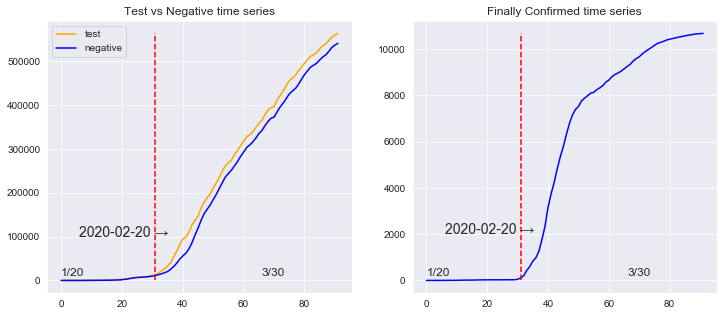

In [46]:
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2)
fig.set_size_inches(12,5)

max_value = max(time['test'].max(), time['negative'].max())

ax1.plot(time['test'],color = 'orange')
ax1.plot(time['negative'],color = 'blue')
ax1.plot([31,31],[0,max_value],color = 'red',linestyle = 'dashed')
ax1.text(6,100000, "2020-02-20 →", fontsize=14)
ax1.text(0,10000,'1/20', fontsize = 12)
ax1.text(66,10000,'3/30', fontsize = 12)
ax1.legend(['test','negative'])
ax1.set_title('Test vs Negative time series')

max_value = time['confirmed'].max()
ax2.plot(time['confirmed'], color = 'blue')
ax2.plot([31,31],[0,max_value],color = 'red',linestyle = 'dashed')
ax2.text(6,2000, "2020-02-20 →", fontsize=14)
ax2.text(0,200,'1/20', fontsize = 12)
ax2.text(66,200,'3/30', fontsize = 12)
ax2.set_title('Finally Confirmed time series')

plt.show()

In [47]:
patient_temp = patient.copy()

In [50]:
patient_temp.head()

,patient_id,global_num,sex,birth_year,age,country,province,city,disease,infection_case,infection_order,infected_by,contact_number,symptom_onset_date,confirmed_date,released_date,deceased_date,state,age_2020
0,1000000001,2.0,male,1964.0,50s,Korea,Seoul,Gangseo-gu,NaN,overseas inflow,1.0,NaN,75.0,2020-01-22,2020-01-23,2020-02-05,NaT,released,57.0
1,1000000002,5.0,male,1987.0,30s,Korea,Seoul,Jungnang-gu,NaN,overseas inflow,1.0,NaN,31.0,NaN,2020-01-30,2020-03-02,NaT,released,34.0
2,1000000003,6.0,male,1964.0,50s,Korea,Seoul,Jongno-gu,NaN,contact with patient,2.0,2.002000e+09,17.0,NaN,2020-01-30,2020-02-19,NaT,released,57.0
3,1000000004,7.0,male,1991.0,20s,Korea,Seoul,Mapo-gu,NaN,overseas inflow,1.0,NaN,9.0,2020-01-26,2020-01-30,2020-02-15,NaT,released,30.0
4,1000000005,9.0,female,1992.0,20s,Korea,Seoul,Seongbuk-gu,NaN,contact with patient,2.0,1.000000e+09,2.0,NaN,2020-01-31,2020-02-24,NaT,released,29.0


In [57]:
patient_temp['deceased_date'] = pd.to_datetime(patient_temp['deceased_date'])
patient_temp['confirmed_date'] = pd.to_datetime(patient_temp['confirmed_date'])
patient_temp['released_date'] = pd.to_datetime(patient_temp['released_date'])
# patient_temp['symptom_onset_date'] = pd.to_datetime(patient_temp['symptom_onset_date'])

patient_temp['days_to_death'] = (patient_temp['deceased_date'] - patient_temp['confirmed_date']).dt.days
patient_temp['days_to_release'] = (patient_temp['released_date'] - patient_temp['confirmed_date']).dt.days
# patient_temp['days_to_confirm'] = (patient_temp['confirmed_date'] - patient_temp['symptom_onset_date']).dt.days

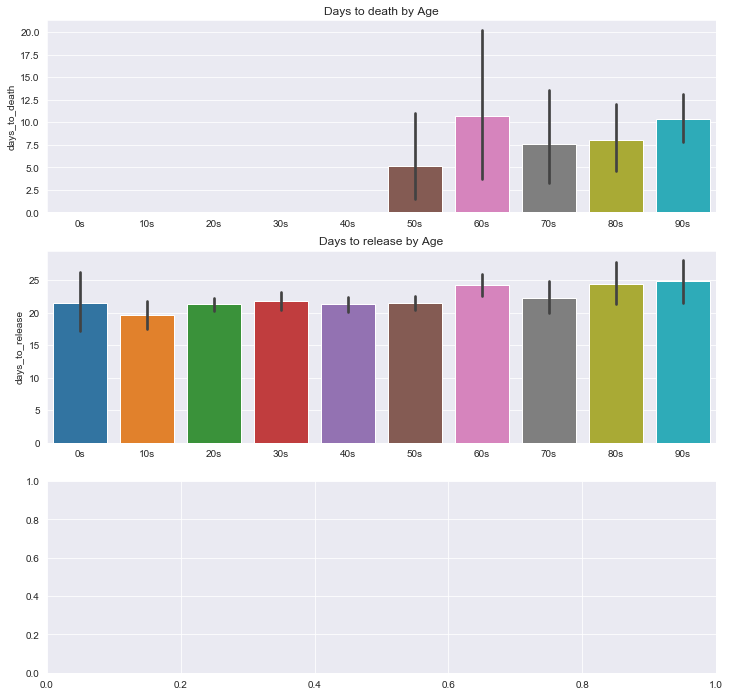

In [59]:
fig, (ax1, ax2, ax3) = plt.subplots(nrows=3, ncols=1)
fig.set_size_inches(12,12)

sns.barplot(x='age',y='days_to_death', data=patient_temp,
           order = ['0s','10s','20s','30s','40s','50s','60s','70s','80s','90s'],
           ax = ax1)
ax1.set(title = 'Days to death by Age', xlabel = '')

sns.barplot(x='age',y='days_to_release', data=patient_temp,
           order = ['0s','10s','20s','30s','40s','50s','60s','70s','80s','90s'],
           ax = ax2)
ax2.set(title = 'Days to release by Age', xlabel = '')

# sns.barplot(x='age',y='days_to_confirm', data=patient_temp,
#            order = ['0s','10s','20s','30s','40s','50s','60s','70s','80s','90s'],
#            ax = ax3)
# ax3.set(title = 'Days to confirm by Age', xlabel = 'Age')

plt.show()